In [1]:
import numpy as np
import matplotlib.pyplot as plt



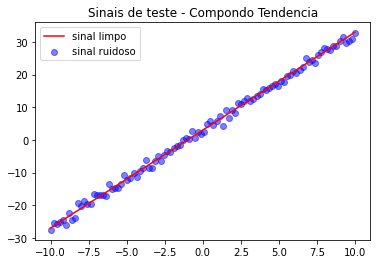

In [2]:
# Primeiro gerando os dados para fazer a filtragem de sinais
x = np.linspace(-10, 10, 100)
alfa = 3
beta = 3
reta = alfa*x + beta
ruido = 1*np.random.randn(100)
reta_ruido = reta + ruido

plt.plot(x, reta, color = 'red', alpha = 1, label = 'sinal limpo')
plt.scatter(x, reta_ruido, color = 'blue', alpha = 0.5,  label = 'sinal ruidoso')
plt.legend()
plt.title('Sinais de teste - Compondo Tendencia')
plt.show()

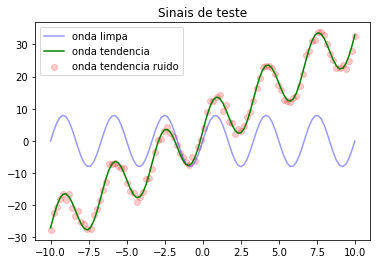

In [3]:
# gerando um onda com tendencia
sinal_onda = 8*np.sin(2*np.pi*0.3*x)
sinal_com_tendencia = sinal_onda + reta 
sinal_com_tendencia_ruido = sinal_onda + reta_ruido
plt.plot(x, sinal_onda, color = 'b', alpha = .4, label = 'onda limpa')
plt.plot(x, sinal_com_tendencia, color = 'g', alpha = 1, label = 'onda tendencia')
plt.scatter(x, sinal_com_tendencia_ruido, color = 'red', alpha = .2, label = 'onda tendencia ruido')
plt.legend()
plt.title('Sinais de teste')
plt.show()



In [4]:
# Funcoes Auxiliares
from numpy.linalg import svd

def criar_hankel_matrix(sinal, ordem):
    M = ordem
    N = len(sinal)
    L = N - M + 1
    h = np.zeros((L, M))
    for i in range(M):
        h[:, i] = sinal[i:i+L]
    return h

def reconstruir_sinal_hankel(h):
    cols = h.shape[1]
    signal_rec = h[:, 0]
    signal_rec = np.hstack((signal_rec, h[-1, 1:]))

    return signal_rec


def filtro_svd_hankel(sinal, hankel_ordem, rec_ordem):

    H_sinal = criar_hankel_matrix(sinal, hankel_ordem)
    U, S, Vt = svd(H_sinal, full_matrices = False)
    H_rec = ((U[:, 0:rec_ordem] * S[0:rec_ordem])) @ Vt[0:rec_ordem, :]
    sinal_filtrado = reconstruir_sinal_hankel(H_rec)
    return sinal_filtrado


x = np.array([1,2,3,4,5])
h = criar_hankel_matrix(x, 2)
print(h)
print(reconstruir_sinal_hankel(h))

[[1. 2.]
 [2. 3.]
 [3. 4.]
 [4. 5.]]
[1. 2. 3. 4. 5.]


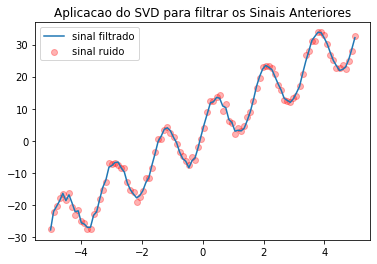



Erro de Reconstrução: 0.399


In [13]:
x = np.linspace(-5, 5, 100)
sinal_filt = filtro_svd_hankel(sinal_com_tendencia_ruido, 20, 5)
plt.plot(x, sinal_filt, alpha = 1, label = 'sinal filtrado')
plt.scatter(x, sinal_com_tendencia_ruido, c = 'r', alpha = .3, label = 'sinal ruido')
plt.legend()
plt.title('Aplicacao do SVD para filtrar os Sinais Anteriores')
plt.show()
print('\n')
print("Erro de Reconstrução: {:.3f}".format(np.mean((sinal_com_tendencia - sinal_filt)**2)))


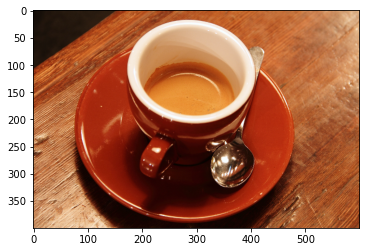

Antes de Pre Processar:  (400, 600, 3)


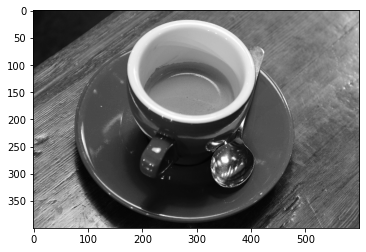

Apos o Processamento:  (400, 600)


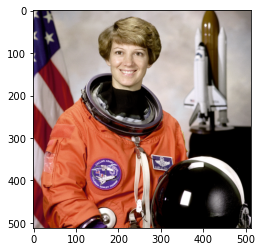

Antes de Pre Processar:  (512, 512, 3)


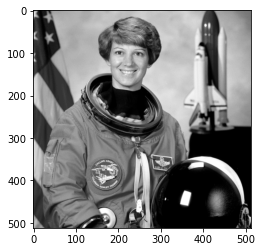

Apos o Processamento:  (512, 512)


In [14]:
#Fazer o SVD para Compressão de Imagens
from skimage import data

#Carregando as imagens 
chamar_cafe = getattr(data,'coffee')
chamar_astronauta = getattr(data, 'astronaut')
imagem_1 = chamar_cafe()
imagem_2 = chamar_astronauta()
def converter_nivel_cinza(im):
    
    if len(im.shape) > 2:
        return im.mean(axis=2)
    else:
        return im

plt.imshow(imagem_1)
plt.show()
print("Antes de Pre Processar: ", imagem_1.shape)

im_cinza_1 = converter_nivel_cinza(imagem_1)
plt.imshow(im_cinza_1, cmap = 'gray')
plt.show()
print("Apos o Processamento: ", im_cinza_1.shape)

plt.imshow(imagem_2)
plt.show()
print("Antes de Pre Processar: ", imagem_2.shape)

im_cinza_2 = converter_nivel_cinza(imagem_2)
plt.imshow(im_cinza_2, cmap = 'gray')
plt.show()
print("Apos o Processamento: ", im_cinza_2.shape)


In [15]:

def fazer_compressao_SVD(im, ordem):
    
    if len(im.shape) > 2:
        N, M, C = im.shape
    else:
        N, M = im.shape
    
    if ordem > max(N, M):
        raise ValueError("Ordem é no maximo {}".format(max(N, M)))

    #Construindo a BASE
    if len(im.shape) == 2:
        U, S, Vt = svd(im, full_matrices = False)
        reconstrucao = (U[:, 0:ordem] * S[:ordem]) @ Vt[0:ordem, :]
    else:
        reconstrucao = np.zeros_like(im)
        for canal in range(C):
            U, S, Vt = svd(im[:, :, canal], full_matrices = False)
            reconstrucao[:, :, canal] = (U[:, 0:ordem] * S[:ordem]) @ Vt[0:ordem, :]
    
    return reconstrucao


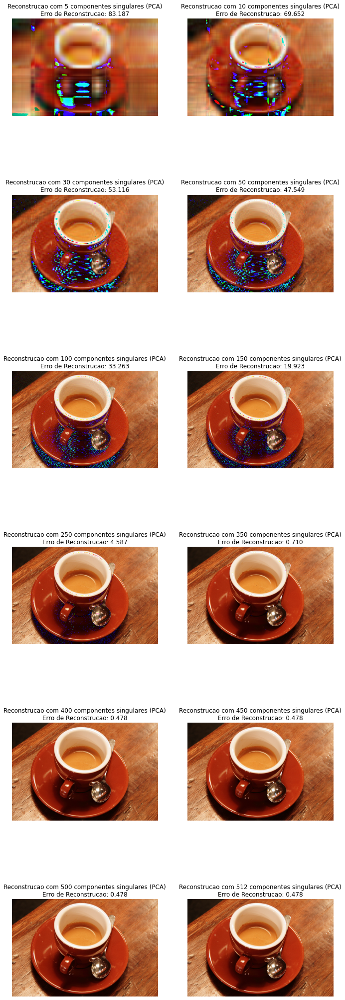

In [16]:
#Plotando Imagem_1 Colorida

teste_energy = [5, 10, 30, 50, 100, 150, 250, 350, 400, 450, 500, 512]
fig, ax = plt.subplots(nrows = 6, ncols = 2, figsize = (7, 7))
ax = ax.ravel()
fig.tight_layout()
fig.set_size_inches(10, 30)
for i in range(6*2):
    im_rec = fazer_compressao_SVD(imagem_1, teste_energy[i])
    erro_rec = np.mean((np.ravel(imagem_1) - np.ravel(im_rec))**2)
    ax[i].imshow(im_rec)
    ax[i].set_title("Reconstrucao com {0} componentes singulares (PCA)\nErro de Reconstrucao: {1:.3f}".format(teste_energy[i], erro_rec))
    ax[i].set_axis_off()
plt.show()

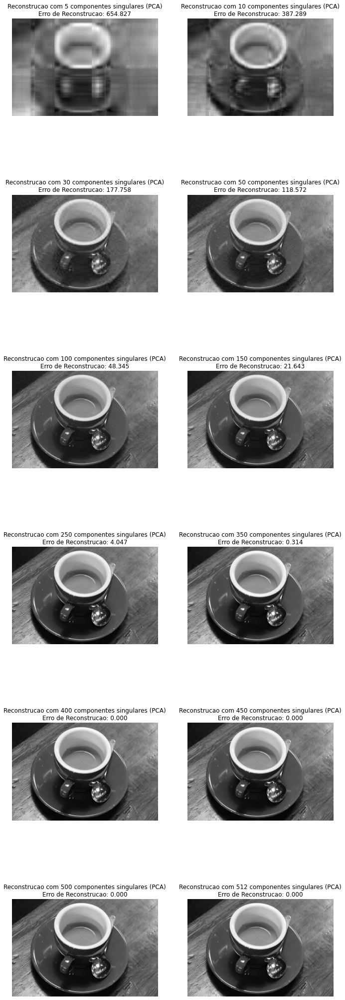

In [19]:
#Plotando Imagem_1 Cinza

teste_energy = [5, 10, 30, 50, 100, 150, 250, 
                350, 400, 450, 500, 512]
fig, ax = plt.subplots(nrows = 6, ncols = 2, figsize = (7, 7))
ax = ax.ravel()
fig.tight_layout()
fig.set_size_inches(10, 30)
for i in range(6*2):
    im_rec = fazer_compressao_SVD(im_cinza_1, teste_energy[i])
    erro_rec = np.mean((np.ravel(im_cinza_1) - np.ravel(im_rec))**2)
    ax[i].imshow(im_rec, cmap = 'gray')
    ax[i].set_title("Reconstrucao com {0} componentes singulares (PCA)\nErro de Reconstrucao: {1:.3f}".format(teste_energy[i], erro_rec))
    ax[i].set_axis_off()
plt.show()

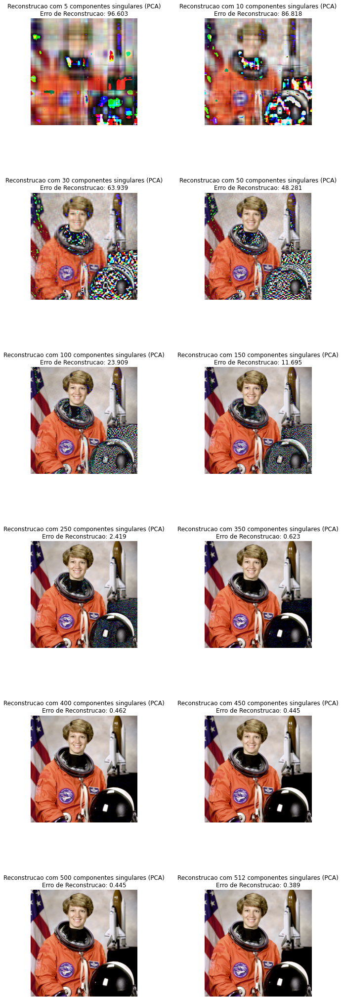

In [20]:
#Plotando Imagem_2 Colorida

teste_energy = [5, 10, 30, 50, 100, 150, 
                250, 350, 400, 450, 500, 512]
fig, ax = plt.subplots(nrows = 6, ncols = 2, figsize = (7, 7))
ax = ax.ravel()
fig.tight_layout()
fig.set_size_inches(10, 30)
for i in range(6*2):
    im_rec = fazer_compressao_SVD(imagem_2, teste_energy[i])
    erro_rec = np.mean((np.ravel(imagem_2) - np.ravel(im_rec))**2)
    ax[i].imshow(im_rec)
    ax[i].set_title("Reconstrucao com {0} componentes singulares (PCA)\nErro de Reconstrucao: {1:.3f}".format(teste_energy[i], erro_rec))
    ax[i].set_axis_off()
plt.show()

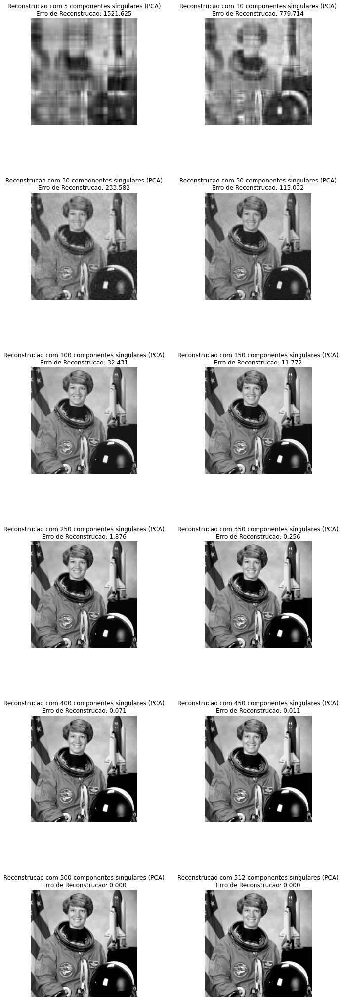

In [22]:
#Plotando Imagem_2 Cinza


teste_energy = [5, 10, 30, 50, 100, 150, 250, 350, 400, 450, 500, 512]
fig, ax = plt.subplots(nrows = 6, ncols = 2, figsize = (7, 7))
ax = ax.ravel()
fig.tight_layout()
fig.set_size_inches(10, 30)
for i in range(6*2):
    im_rec = fazer_compressao_SVD(im_cinza_2, teste_energy[i])
    erro_rec = np.mean((np.ravel(im_cinza_2) - np.ravel(im_rec))**2)
    ax[i].imshow(im_rec, cmap = 'gray')
    ax[i].set_title("Reconstrucao com {0} componentes singulares (PCA)\nErro de Reconstrucao: {1:.3f}".format(teste_energy[i], erro_rec))
    ax[i].set_axis_off()
plt.show()